In [750]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
df = pd.read_csv("/mnt/Heart Disease.csv")

'''
Data handling and Pre Processing
'''
df['education'].fillna(df['education'].median(), inplace=True)
df['cigsPerDay'].fillna(df['cigsPerDay'].median(), inplace=True)
df['diaBP'].fillna(df['diaBP'].median(), inplace=True)
df['BPMeds'].fillna(df['BPMeds'].mode()[0], inplace=True)
df['glucose'].fillna(df['glucose'].median(), inplace=True)
df['BMI'].fillna(df['BMI'].median(), inplace=True)
df['heartRate'].fillna(df['heartRate'].median(), inplace=True)
df['age'].fillna(df['age'].median(), inplace=True)
df['sysBP'].fillna(df['sysBP'].median(), inplace=True)

df['male'].fillna(df['male'].mode()[0], inplace=True)
df['currentSmoker'].fillna(df['currentSmoker'].mode()[0], inplace=True)
df['totChol'].fillna(df['totChol'].median(), inplace=True)
df['prevalentStroke'].fillna(df['prevalentStroke'].mode()[0], inplace=True)
df['diabetes'].fillna(df['diabetes'].mode()[0], inplace=True)
df.head()

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,HeartDisease
0,1,39,4.0,0,0.0,0.0,0,0,0,195.0,106.0,70.0,26.97,80.0,77.0,0
1,0,46,2.0,0,0.0,0.0,0,0,0,250.0,121.0,81.0,28.73,95.0,76.0,0
2,1,48,1.0,1,20.0,0.0,0,0,0,245.0,127.5,80.0,25.34,75.0,70.0,0
3,0,61,3.0,1,30.0,0.0,0,1,0,225.0,150.0,95.0,28.58,65.0,103.0,1
4,0,46,3.0,1,23.0,0.0,0,0,0,285.0,130.0,84.0,23.10,85.0,85.0,0


In [751]:

'''
Logistic Regression Class
'''

from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.metrics import accuracy_score

class LogisticRegression:
  iterations = None
  eta = None
  x = None
  y = None
  def __init__(self,eta=0.05,iterations = 500):
    self.iterations = iterations
    self.eta = eta
    self.weights = None
    self.train_loss = np.full(self.iterations, np.nan)
    self.train_accuracy = np.zeros(self.iterations)
    '''
    Make the data fit and change shapes accordingly
    '''
  def fitting(self,x,y):
    x = np.hstack((np.ones((x.shape[0],1)),x)) # size of x is now m x 16
    self.x = x
    self.y = y # size of y is m x 1
    print(f"Shape of X is {self.x.shape}\nShape of Y is {self.y.shape}")


  # Sigmoid
  def sigmoid(self,z):
    #it return an m x 1 vector with prob of each data point in the sample
    value = 1/(1+np.exp(-(z @ self.weights))) # multiplying we get x be as m x 16 (beacuse bias) and weights will be (16 x 1)
    return value

#Loss Function as cross entropy loss
  def logLoss(self,x,y):
    prob = self.sigmoid(x) # it is a vector of m x 1 which is a prob of each m data point
    sample_numbers = len(y)
    '''
    y : m x 1

    prob : m x 1
    '''
    return -(1/sample_numbers)*np.sum(y.T @ np.log(prob+1e-9) + (1-y).T @ np.log(1-prob+1e-9))
# Return Probabilities of each data point
  def get_y_hat(self,x):
    return self.sigmoid(x)
# gives predicted y for x
  def get_prediction(self,x):
    ans = self.get_y_hat(x)
    return (ans>=0.5).astype(int)
# Batch gradient Descent
  def normal_logistic(self,debug=False):
    self.weights = np.ones((self.x.shape[1],1)) # it will now have 16 rows and 1 column
    self.train_accuracy = np.zeros(self.iterations)
    for i in range(self.iterations):
      y_hat = self.get_y_hat(self.x)
      gradient = (1/(self.y.shape[0])) * np.dot(self.x.T,(y_hat-self.y))
      self.weights = self.weights - (self.eta * gradient)
      loss = self.logLoss(self.x,self.y)
      self.train_loss[i] = loss
      self.train_accuracy[i] = accuracy_score(self.y,self.get_prediction(self.x))
      if debug:
        print(f"Epoch: {i+1}\nLoss: {loss}")
        # print(self.weights)
# Randomly shuffle data for MBGD and SGD
  def data_shuffling(self):
    n = self.x.shape[0]
    perms = np.random.permutation(n)
    return self.x[perms], self.y[perms]
#mini batch implementation
  def mini_batch_logistic(self,debug=False,batch_size=100):
    self.weights = np.ones((self.x.shape[1],1)) # it will now have 16 rows and 1 column
    # self.weights = np.random.rand(self.x.shape[1],1) # it will now have 16 rows and 1 column
    self.train_loss = np.full(self.iterations, np.nan)
    self.train_accuracy = np.zeros(self.iterations)
    # self.train_accuracy = np.full(self.iterations,np.nan)
    for i in range(self.iterations):
      new_x, new_y = self.data_shuffling()
      total_loss = 0
      acc = 0
      num = 0
      for j in range(0,new_x.shape[0],batch_size):
        x_batch = new_x[j:j+batch_size]
        y_batch = new_y[j:j+batch_size]
        num+=1
        y_hat_for_batch = self.sigmoid(x_batch)
        gradient = (1/y_batch.shape[0]) * np.dot(x_batch.T,(y_hat_for_batch - y_batch))
        self.weights = self.weights - (self.eta * gradient)
        batch_loss = self.logLoss(x_batch,y_batch)
        total_loss += batch_loss
        # acc += accuracy_score(y_batch,self.get_prediction(x_batch))#* x_batch.shape[0]
        # self.train_accuracy[j-batch_size] = acc
        # count+=1
        if debug:
          print(f"Epoch: {i+1}\nPer Batch Loss: {batch_loss}")
      self.train_loss[i] = (total_loss/self.x.shape[0])
      self.train_accuracy[i] = accuracy_score(self.y,self.get_prediction(self.x))
      # self.train_accuracy[i] = acc/num
      # loss = self.logLoss(self.x,self.y)
      # self.train_loss[i] = loss

# Implementation of Stochastic
  def sto(self,debug=False):
    self.weights = np.zeros((self.x.shape[1],1)) # it will now have 16 rows and 1 column
    self.train_loss = np.full(self.iterations, np.nan)
    self.train_accuracy = np.full(self.iterations, np.nan)
    for i in range(self.iterations):
      new_x, new_y = self.data_shuffling()
      total_loss = 0
      acc=0
      for j in range(0,new_x.shape[0]):
        x_batch = new_x[j:j+1]
        y_batch = new_y[j:j+1]
        y_hat_for_batch = self.sigmoid(x_batch)

        # y_hat_sto = self.sigmoid(new_x)
        # gradient = (1/self.y.shape[0]) * np.dot(new_x.T,(y_hat_sto - new_y))
        gradient = (1/self.y.shape[0]) * np.dot(x_batch.T,(y_hat_for_batch - y_batch))
        self.weights = self.weights - (self.eta * gradient)
        acc += accuracy_score(new_y,self.get_prediction(new_x))
        batch_loss = self.logLoss(x_batch,y_batch)
        # batch_loss = self.logLoss(new_x,new_y)
        total_loss += batch_loss #* x_batch.shape[0]
        if debug:
          print(f"Epoch: {i+1}\nPer Batch Loss: {batch_loss}")
      self.train_loss[i] = (total_loss/self.x.shape[0])
      self.train_accuracy[i] = (acc/self.x.shape[0])
      # loss = self.logLoss(self.x,self.y)


# Following 2 Functions prints and give Confusion Matrix and metrics about data
  def print_confusion_matrix(self):
    conf_m = confusion_matrix(self.y,self.get_prediction(self.x))

    fig, ax = plt.subplots(figsize=(6,4))

    cax = ax.matshow(conf_m, conf_map=plt.conf_m.Blues)

    fig.colorbar(cax)

    plt.xlabel('Predicted')
    plt.ylabel('Actual')

    for i in range(conf_m.shape[0]):
        for j in range(conf_m.shape[1]):
            plt.text(x=j, y=i, s=conf_m[i, j], ha='center', va='center', color='black')

    plt.title('Confusion Matrix')
    plt.show()
  def performance_metrics(self):
    print(f'''Recall :{recall_score(self.y,self.get_prediction(self.x))}\nPrecision :{precision_score(self.y,self.get_prediction(self.x))}\nROC-AOC :{roc_auc_score(self.y,self.get_y_hat(self.x))}\nF1 :{f1_score(self.y,self.get_prediction(self.x))}''')

In [752]:
'''
Dataset split
'''
from sklearn.model_selection import train_test_split
y=df['HeartDisease'].values
x=df.drop("HeartDisease",axis=1).values
x_train, x_temp, y_train, y_temp = train_test_split(x, y, test_size=0.30, random_state=42)

x_val, x_test, y_val, y_test = train_test_split(x_temp, y_temp, test_size=0.50, random_state=42)

In [753]:
modelTrain = LogisticRegression(iterations=1000,eta=0.0001)

'''
For min max eta = 0.01 and iter = 2000
for without eta = 0.0001 and iter = 2000
'''

y_train = y_train.reshape(-1, 1)
y_val = y_val.reshape(-1, 1)

modelTrain.fitting(x=x_train,y=y_train)
modelTrain.normal_logistic()

modelValidate = LogisticRegression(iterations=1000,eta=0.0001)
modelValidate.fitting(x=x_val,y=y_val)
modelValidate.normal_logistic()

Shape of X is (2966, 16)
Shape of Y is (2966, 1)
Shape of X is (636, 16)
Shape of Y is (636, 1)


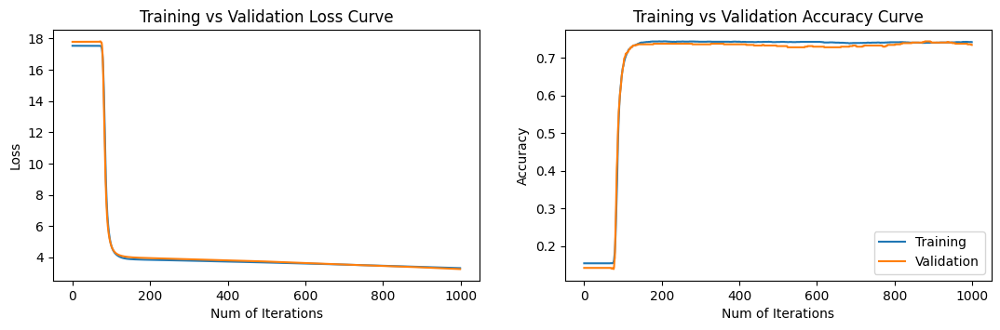

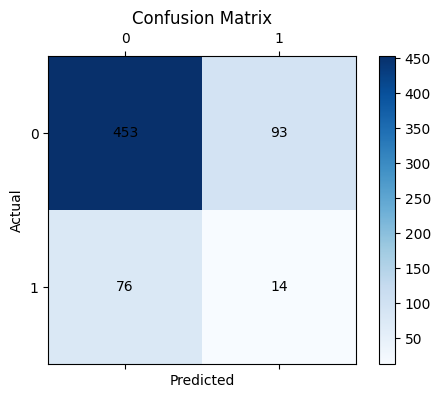

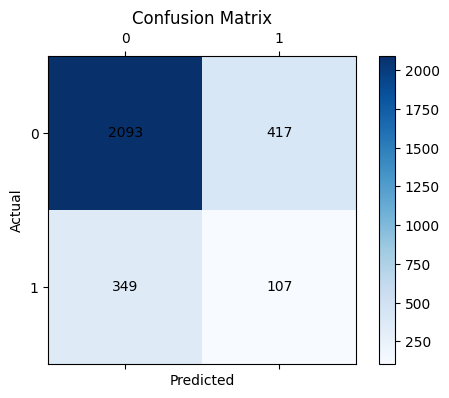

Recall :0.15555555555555556
Precision :0.1308411214953271
ROC-AOC :0.45470085470085464
F1 :0.14213197969543145


In [754]:
'''
Function for plotting the graphs
'''

def plot(Train,Validate):
  fig, ax = plt.subplots(1, 2, figsize=(13, 3.5))
  plt.subplot(1, 2, 1)
  plt.plot(Train.train_loss, label="Training")
  plt.plot(Validate.train_loss, label="Validation")
  plt.subplot(1, 2, 2)
  plt.plot(Train.train_accuracy, label="Training")
  plt.plot(Validate.train_accuracy, label="Validation")
  plt.subplot(1, 2, 1)
  plt.xlabel("Num of Iterations")
  plt.ylabel("Loss")
  plt.title("Training vs Validation Loss Curve")
  plt.subplot(1, 2, 2)
  plt.xlabel("Num of Iterations")
  plt.ylabel("Accuracy")
  plt.title("Training vs Validation Accuracy Curve")
  plt.legend()
plot(modelTrain,modelValidate)
modelValidate.print_confusion_matrix()
modelTrain.print_confusion_matrix()
modelValidate.performance_metrics()

# Min Max Scaling
Now for Min Max. Formula is as
$$
X_{\text{scaled}} = \frac{X - X_{\text{min}}}{X_{\text{max}} - X_{\text{min}}}
$$

Shape of X is (2966, 16)
Shape of Y is (2966, 1)
Shape of X is (636, 16)
Shape of Y is (636, 1)


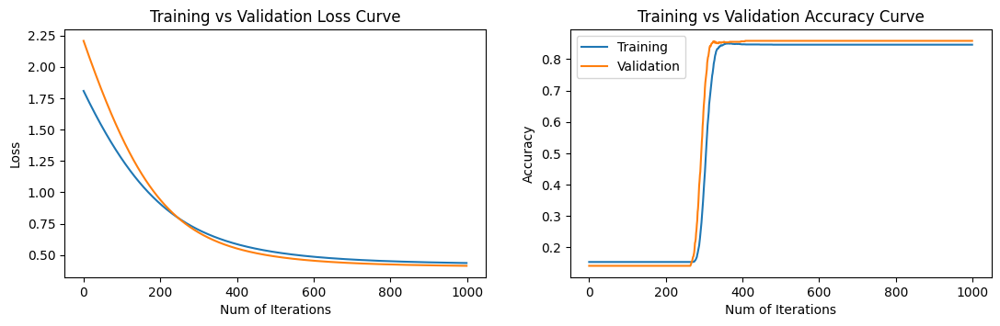

In [755]:
'''
Does min max and trains the model
'''
def min_max_scaling(x:np.ndarray):
  return (x-x.min())/(x.max()-x.min())

x_train_scaled = min_max_scaling(x_train)
x_val_scaled = min_max_scaling(x_val)
modelTrain = LogisticRegression(iterations=1000,eta=0.01)
modelTrain.fitting(x_train_scaled,y_train)
modelTrain.normal_logistic()

modelValidate = LogisticRegression(iterations=1000,eta=0.01)
modelValidate.fitting(x_val_scaled,y_val)
modelValidate.normal_logistic()
plot(modelTrain,modelValidate)

#Mini Batch GD

Following cells shows the implementation and running of MBGD with varying batch sizes



Shape of X is (2966, 16)
Shape of Y is (2966, 1)
Shape of X is (636, 16)
Shape of Y is (636, 1)


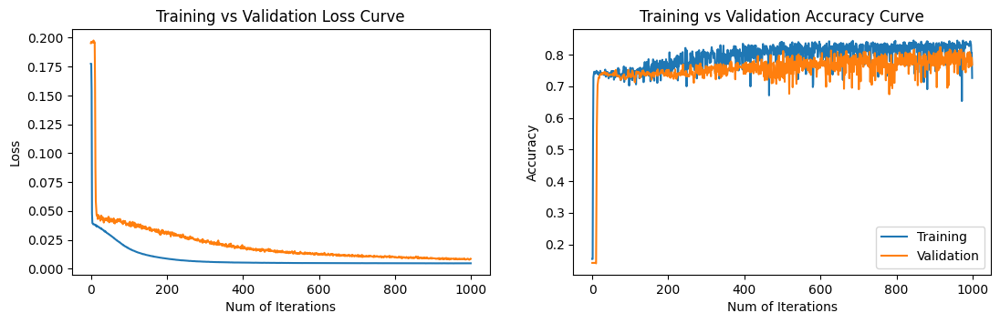

In [756]:
modelTrain100 = LogisticRegression(iterations=1000,eta=0.0001)
modelTrain100.fitting(x_train,y_train)
modelTrain100.mini_batch_logistic()

modelValidate100 = LogisticRegression(iterations=1000,eta=0.0001)
modelValidate100.fitting(x_val,y_val)
modelValidate100.mini_batch_logistic()
plot(modelTrain100,modelValidate100)

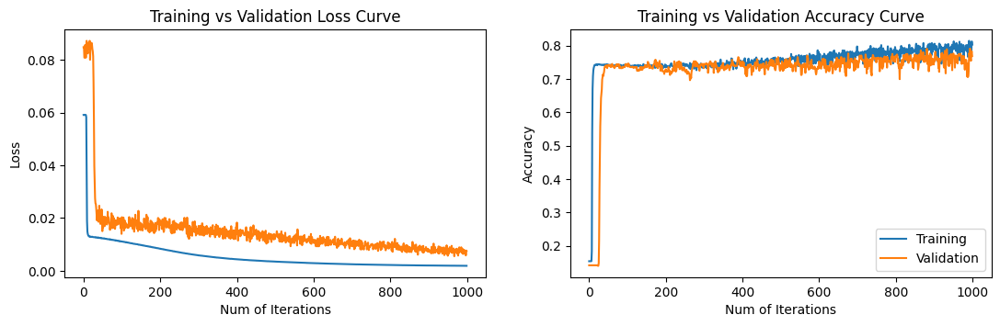

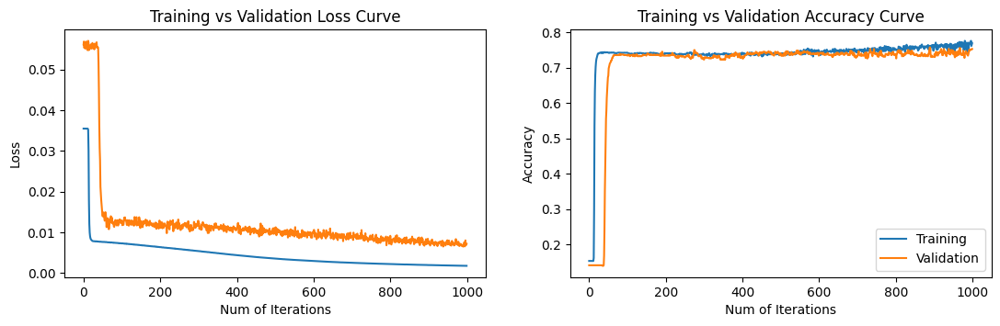

In [757]:
modelTrain100.mini_batch_logistic(batch_size=300)
modelValidate100.mini_batch_logistic(batch_size=300)
plot(modelTrain100,modelValidate100)
# print("-"*20)
# modelTrain.mini_batch_logistic(batch_size=500)
# plot(modelTrain)
# print("-"*20)
# modelTrain.mini_batch_logistic(batch_size=1000,debug=True)
# plot(modelTrain)
# print("-"*20)
modelTrain100.mini_batch_logistic(batch_size=500)
modelValidate100.mini_batch_logistic(batch_size=500)
plot(modelTrain100,modelValidate100)


# Stochastic

Following cells give implementation of Stochastic GD



Shape of X is (2966, 16)
Shape of Y is (2966, 1)
Epoch: 1
Per Batch Loss: 0.5871055250707378
Epoch: 1
Per Batch Loss: 0.5238213538266225
Epoch: 1
Per Batch Loss: 0.7638977434010779
Epoch: 1
Per Batch Loss: 0.6030564537464996
Epoch: 1
Per Batch Loss: 0.5048101277558598
Epoch: 1
Per Batch Loss: 0.48664973816262785
Epoch: 1
Per Batch Loss: 0.3709845028757448
Epoch: 1
Per Batch Loss: 0.9153617951157903
Epoch: 1
Per Batch Loss: 0.42311076858142893
Epoch: 1
Per Batch Loss: 0.40779694885607903
Epoch: 1
Per Batch Loss: 0.35622365113081556
Epoch: 1
Per Batch Loss: 1.0182242862842745
Epoch: 1
Per Batch Loss: 0.39661871162891327
Epoch: 1
Per Batch Loss: 0.9860656164802944
Epoch: 1
Per Batch Loss: 0.4362617431503008
Epoch: 1
Per Batch Loss: 0.43018958538953933
Epoch: 1
Per Batch Loss: 0.3732046712924602
Epoch: 1
Per Batch Loss: 0.33150762014335833
Epoch: 1
Per Batch Loss: 0.33813790265598626
Epoch: 1
Per Batch Loss: 0.2473400348857085
Epoch: 1
Per Batch Loss: 1.223502636958675
Epoch: 1
Per Batch L

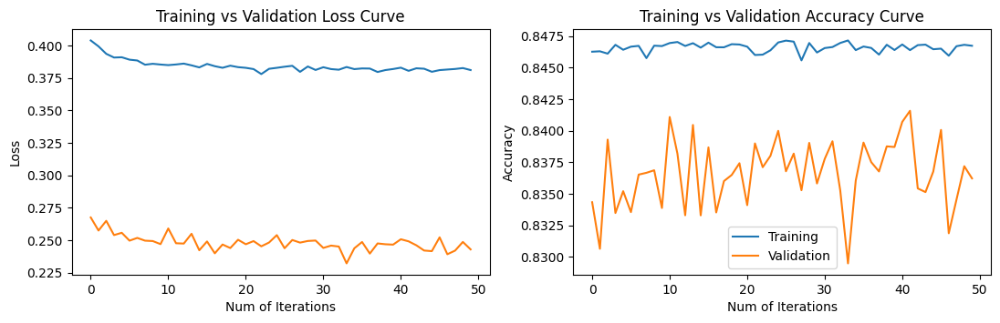

In [761]:
modelTrain = LogisticRegression(iterations=50,eta=0.01)
modelTrain.fitting(x_train,y_train)
modelTrain.sto(debug=True)
print("TRAIN DONE")
modelValidate = LogisticRegression(iterations=50,eta=0.01)
modelValidate.fitting(x_val,y_val)
modelValidate.sto(debug=True)
plot(modelTrain,modelValidate)

# K Fold
